# Take a dataset, do an n-fold creation of training and testing data, use an ensemble to combine them again

In [1]:
from gumps.graph.regressor import RegressorPlotParameters, RegressorPlot
import pandas as pd
import numpy as np
from gumps.studies.batch_study import AbstractBatchStudy
from typing import Callable

from gumps.solvers.sampler import SamplerSolverParameters
from gumps.apps.parametric_sweep import ParametricSweepApp

import matplotlib.pyplot as plt

from gumps.solvers.regressors.pytorch_regressor import TorchMultiLayerPerceptronRegressor, TorchMultiLayerPerceptronRegressionParameters
from gumps.solvers.regressors.ensemble_regressor import EnsembleRegressor, EnsembleParameters
from gumps.solvers.mutual_info import MutualSettings, MutualInfoRegression

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Create a basic dataset

In [2]:
# a will require log-scaling
# b will require linear-scaling
# c will range from -1 to 1
# d will require logs-scaling

# w will require linear scaling
# x will require log-scaling
# y will range from 0 to 1
# z will require log-scaling

class SyntheticBatchStudy(AbstractBatchStudy):
    "batch version of sphere study (designed to approximate surrogate model)"

    def __init__(self, *, model_variables:dict):
        self.model_variables = model_variables

    def start(self):
        "initialize this study"

    def stop(self):
        "handle shutdown tasks"

    def run(self, input_data:pd.DataFrame, processing_function:Callable|None=None) -> pd.DataFrame:
        "run the batch simulation"
        output_data = pd.DataFrame()
        output_data["w"] = np.log(input_data["a"]) * input_data['b']
        output_data["x"] = np.exp(input_data['b'])
        output_data["y"] = input_data['c']**2
        output_data["z"] = input_data['d'] * input_data['b']

        self.save_results(input_data, output_data)

        if processing_function is None:
            return output_data
        else:
            return processing_function(output_data)

In [3]:
def get_all(frame:pd.DataFrame) -> pd.DataFrame:
    "processing function to get the total from the dataframe"
    return frame

In [4]:
batch = SyntheticBatchStudy(model_variables={})

parameters = SamplerSolverParameters(
    number_of_samples = 200,
    lower_bound = {'a':1e0, 'b':1, 'c':-1, 'd':1e-7},
    upper_bound = {'a':1e7, 'b':100, 'c':1, 'd':1e-2},
    sampler = "sobol"
    )

app = ParametricSweepApp(parameters=parameters,
        processing_function=get_all,
        directory=None,
        batch=batch)
app.run()

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


In [5]:
mutual_settings = MutualSettings(app.factors, app.responses, n_neighbors=20)
mutual = MutualInfoRegression(mutual_settings)
mutual.fit()

In [6]:
mutual.score()

,w,x,y,z
a,0.043401,0.000956,0.00000,0.000000
b,0.618103,0.012931,0.00000,0.008974
c,0.000000,0.000238,0.96903,0.000000
d,0.000000,0.005526,0.00000,0.392870


In [7]:
mutual.score_scaled()

,w,x,y,z
a,0.079923,0.000000,0.000000,0.000000
b,0.618103,2.275291,0.000000,0.059643
c,0.000000,0.000000,0.969304,0.000000
d,0.000000,0.000000,0.000000,0.871339


<Axes: >

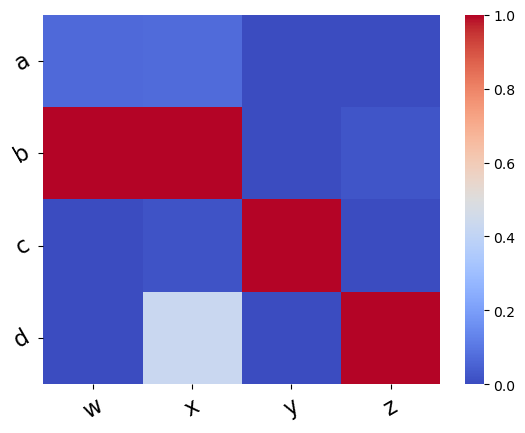

In [8]:
mutual.plot()

<Axes: >

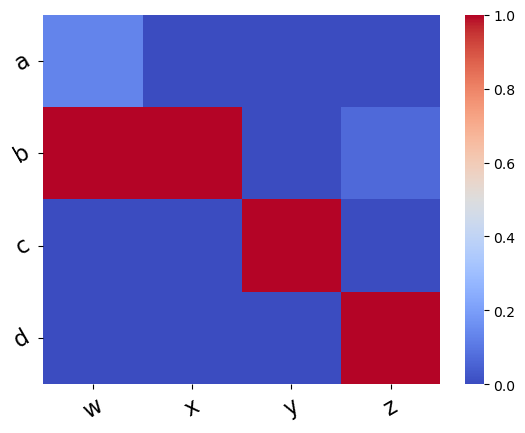

In [9]:
mutual.plot_scaled()

## Build a pyTorch regressor that we can put into the ensemble

In [10]:
reg_data = TorchMultiLayerPerceptronRegressionParameters(input_data=app.factors, 
                                        output_data=app.responses,
                                        learning_rate="adaptive",
                                        hidden_layer_sizes=[512, 512, 64, 8, 64, 128],
                                        learning_rate_patience=25,
                                        learning_rate_factor=0.7,
                                        learning_rate_init=0.0007,
                                        early_stopping_patience=50,
                                        train_test_split="sequential",
                                        validation_fraction=0.25,
                                        max_iter=1000,
                                        batch_size=128)

regressor_inner = TorchMultiLayerPerceptronRegressor(reg_data)

# Build an ensemble regressor

In [11]:
ensemble_parameters = EnsembleParameters(input_data=app.factors,
                                         output_data=app.responses,
                                        regressor = regressor_inner,
                                        number_regressors = 10,
                                        validation_fraction = 0.25)

ensemble = EnsembleRegressor(ensemble_parameters)
ensemble.fit()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 767: 100%|██████████| 2/2 [00:00<00:00, 70.92it/s, val_loss=5.45e-5, train_loss=6.05e-6] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 695: 100%|██████████| 2/2 [00:00<00:00, 72.23it/s, val_loss=7.84e-5, train_loss=6.34e-6] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 138: 100%|██████████| 2/2 [00:00<00:00, 59.53it/s, val_loss=0.00304, train_loss=0.00101] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 605: 100%|██████████| 2/2 [00:00<00:00, 68.10it/s, val_loss=8.6e-5, train_loss=1.25e-5]  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 413: 100%|██████████| 2/2 [00:00<00:00, 40.82it/s, val_loss=0.000148, train_loss=2.28e-5] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 762: 100%|██████████| 2/2 [00:00<00:00, 74.14it/s, val_loss=6e-5, train_loss=1.09e-5]    


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 506: 100%|██████████| 2/2 [00:00<00:00, 71.72it/s, val_loss=7.81e-5, train_loss=9.78e-6] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 414: 100%|██████████| 2/2 [00:00<00:00, 69.84it/s, val_loss=0.000118, train_loss=1.53e-5] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 712: 100%|██████████| 2/2 [00:00<00:00, 73.15it/s, val_loss=7.15e-5, train_loss=5.34e-6] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 642: 100%|██████████| 2/2 [00:00<00:00, 61.01it/s, val_loss=8.01e-5, train_loss=9.82e-6] 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 560: 100%|██████████| 2/2 [00:00<00:00, 62.21it/s, val_loss=0.000159, train_loss=1.06e-5] 


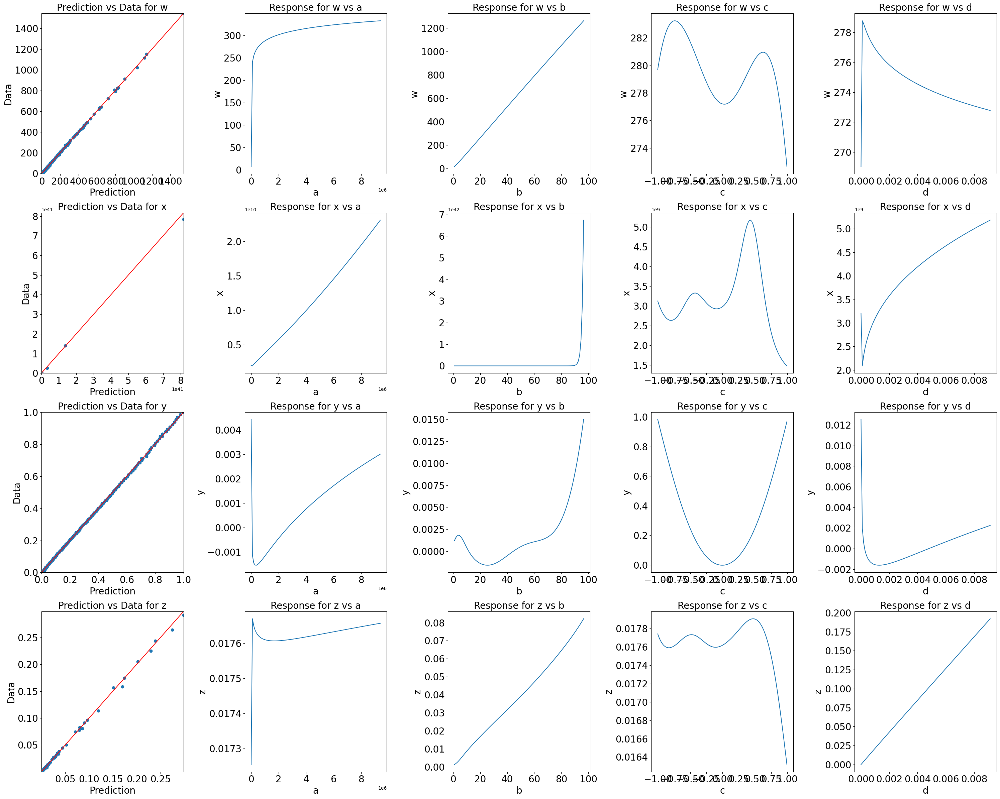

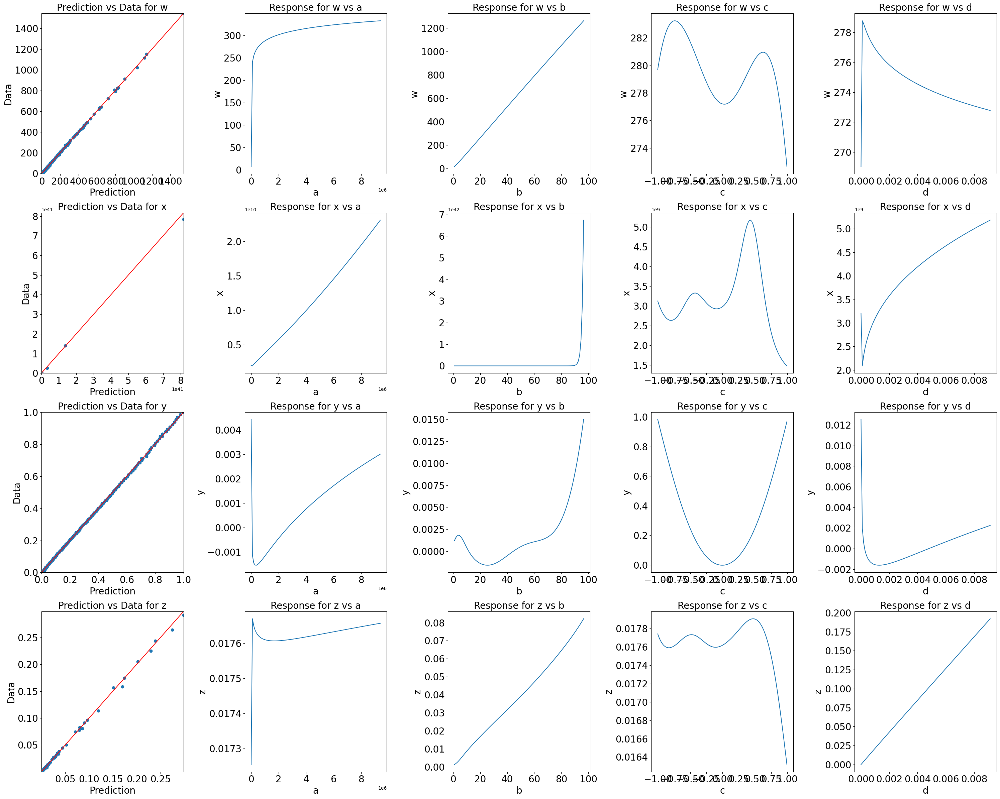

In [12]:
params_full = RegressorPlotParameters(ensemble, app.factors.mean(), app.factors.min(), app.factors.max())
reg_plot_full = RegressorPlot(params_full)
reg_plot_full.plot()
reg_plot_full.plot_scaled()

In [13]:
for idx, regressor in enumerate(ensemble.regressors):
    print(f'Regressor {idx} nrmse: {regressor.error_metrics()["nrmse"]}')

Regressor 0 nrmse: 0.22057095913014527
Regressor 1 nrmse: 0.07828270087366238
Regressor 2 nrmse: 0.049163541367290974
Regressor 3 nrmse: 0.16758537794026135
Regressor 4 nrmse: 0.007550378665982268
Regressor 5 nrmse: 0.05217572144134758
Regressor 6 nrmse: 0.01767304243859271
Regressor 7 nrmse: 0.017453178071155394
Regressor 8 nrmse: 0.004537210101511698
Regressor 9 nrmse: 0.010500833771607206


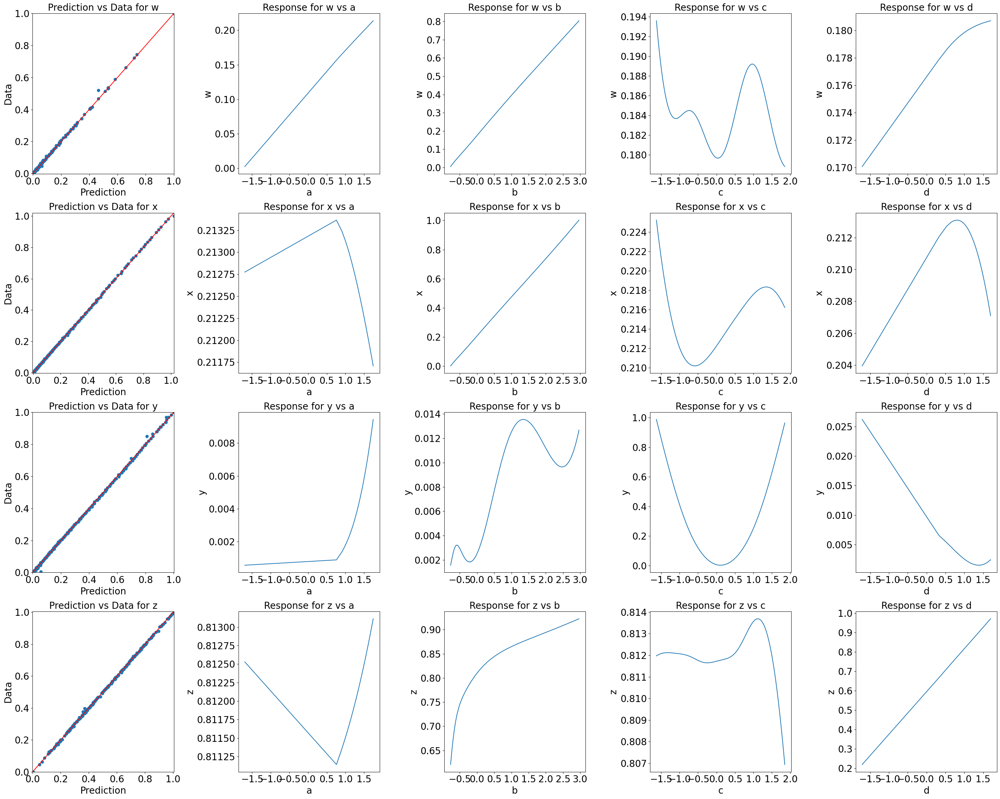

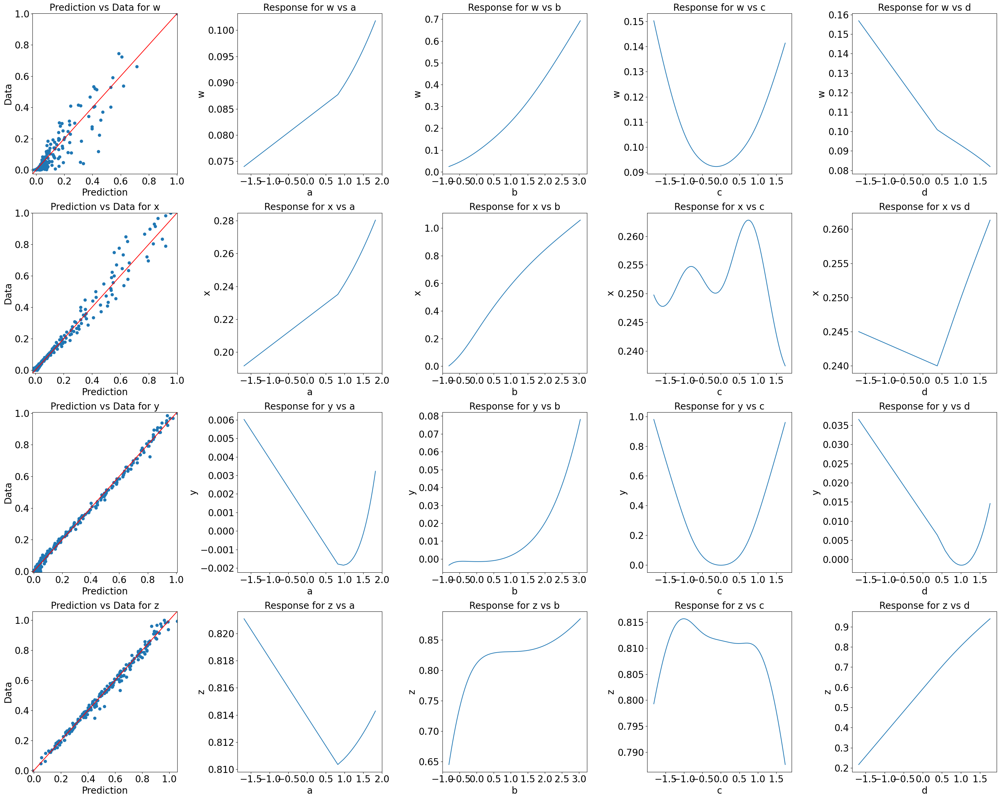

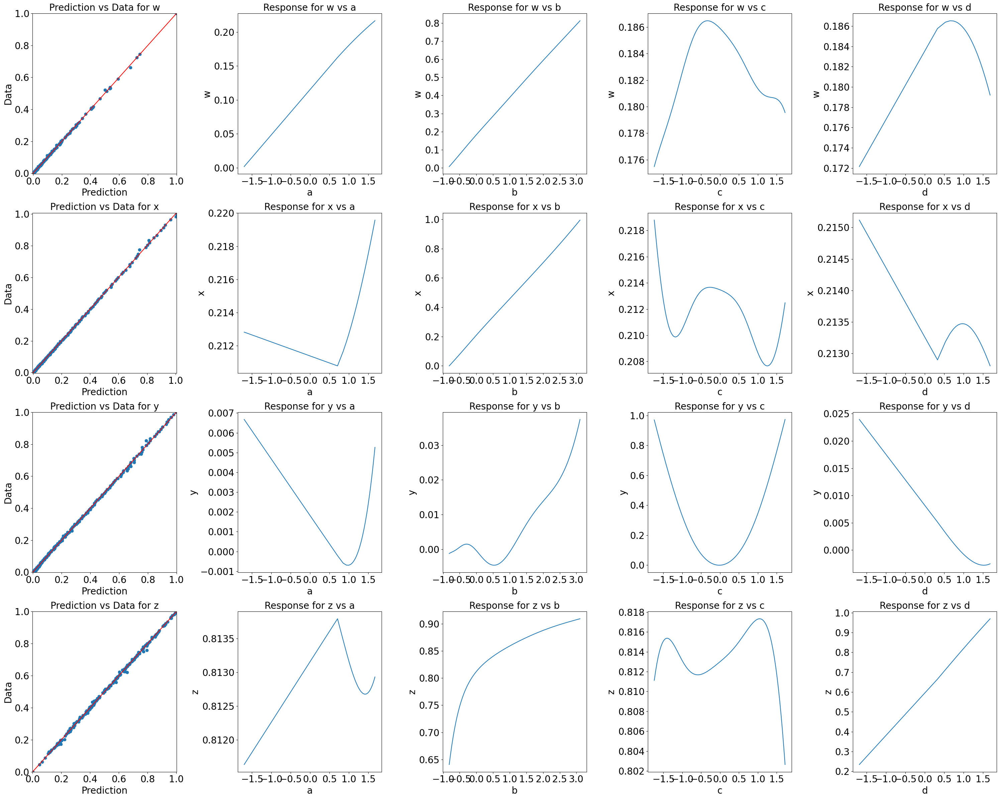

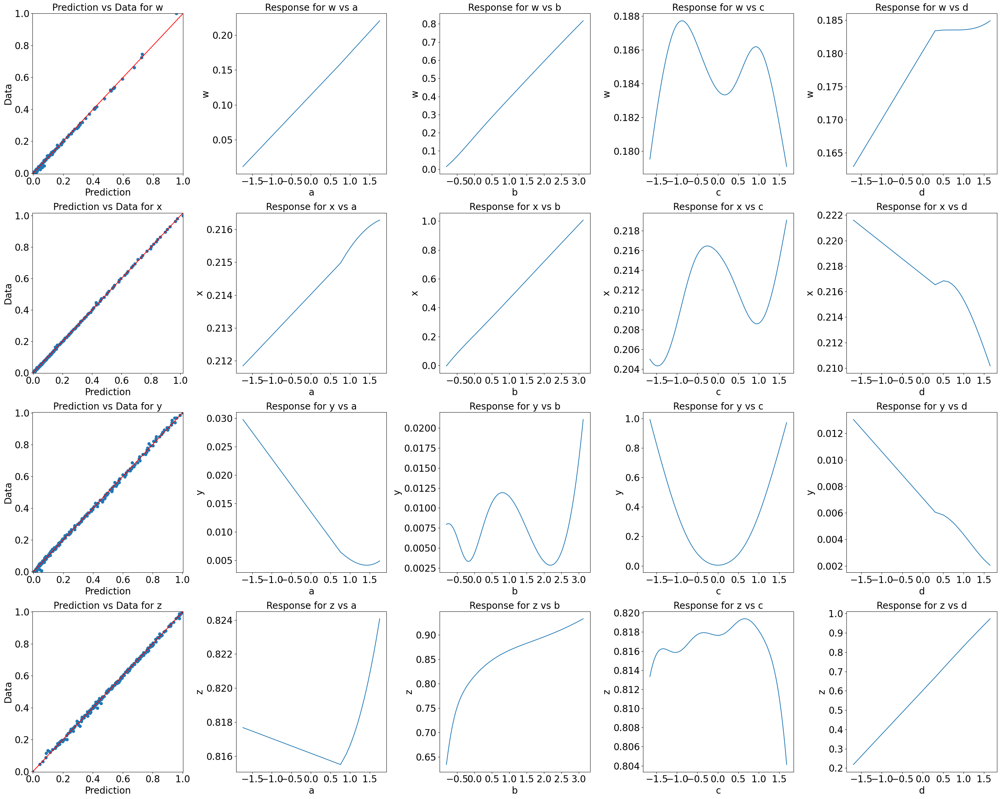

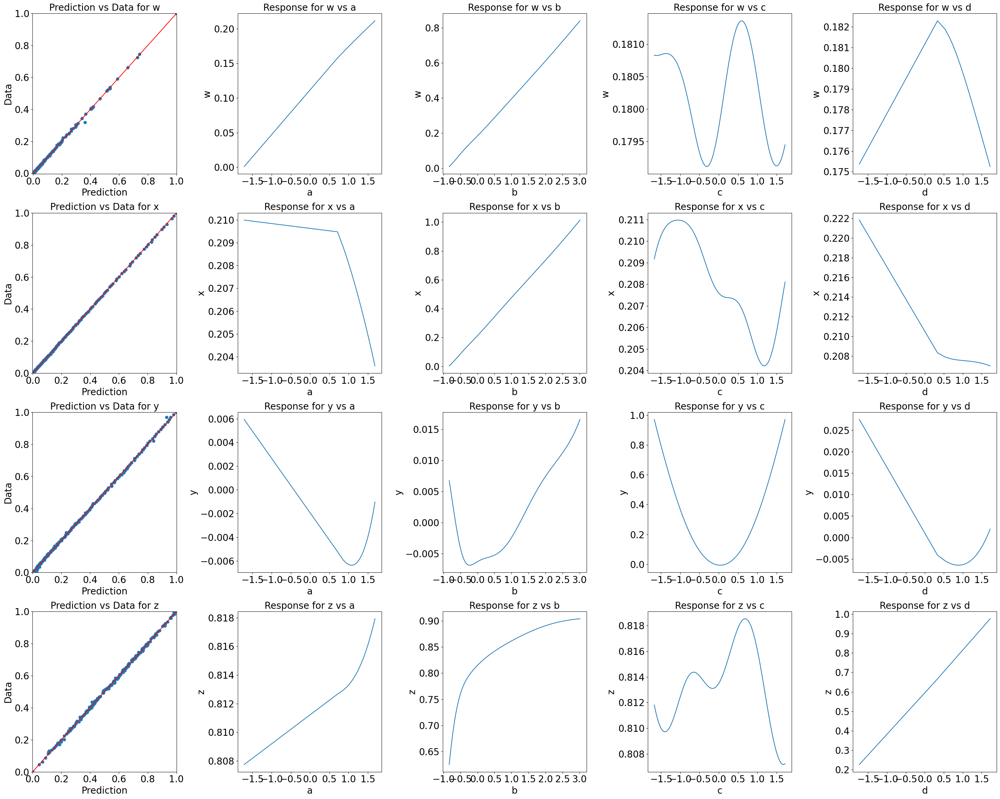

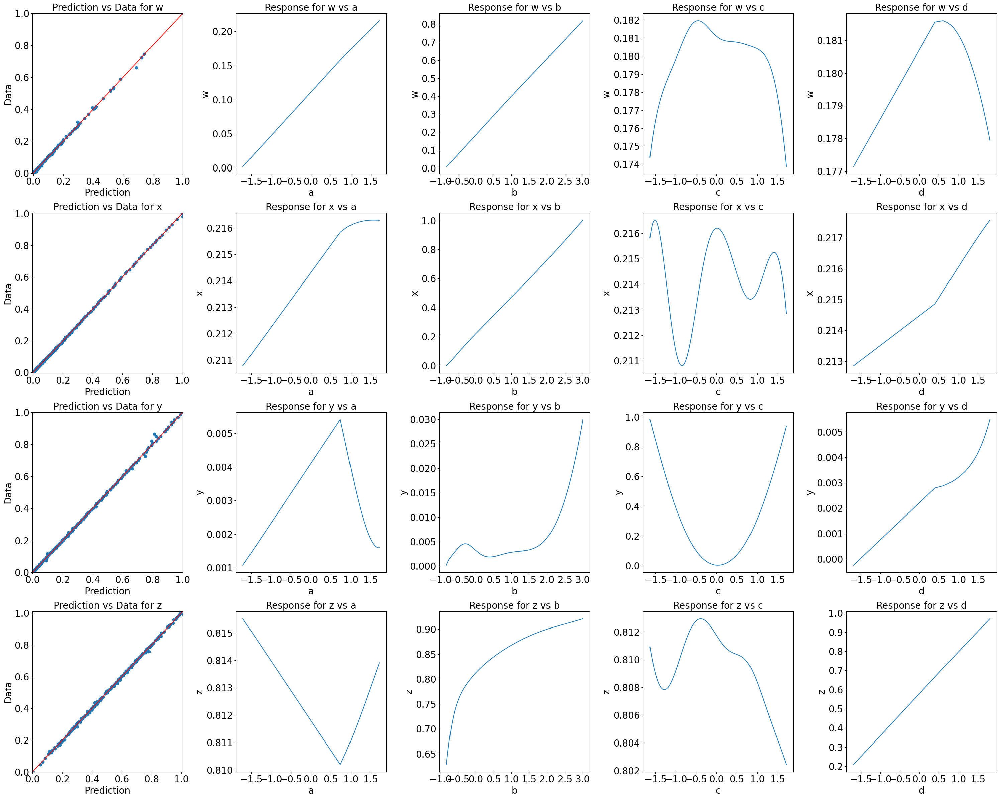

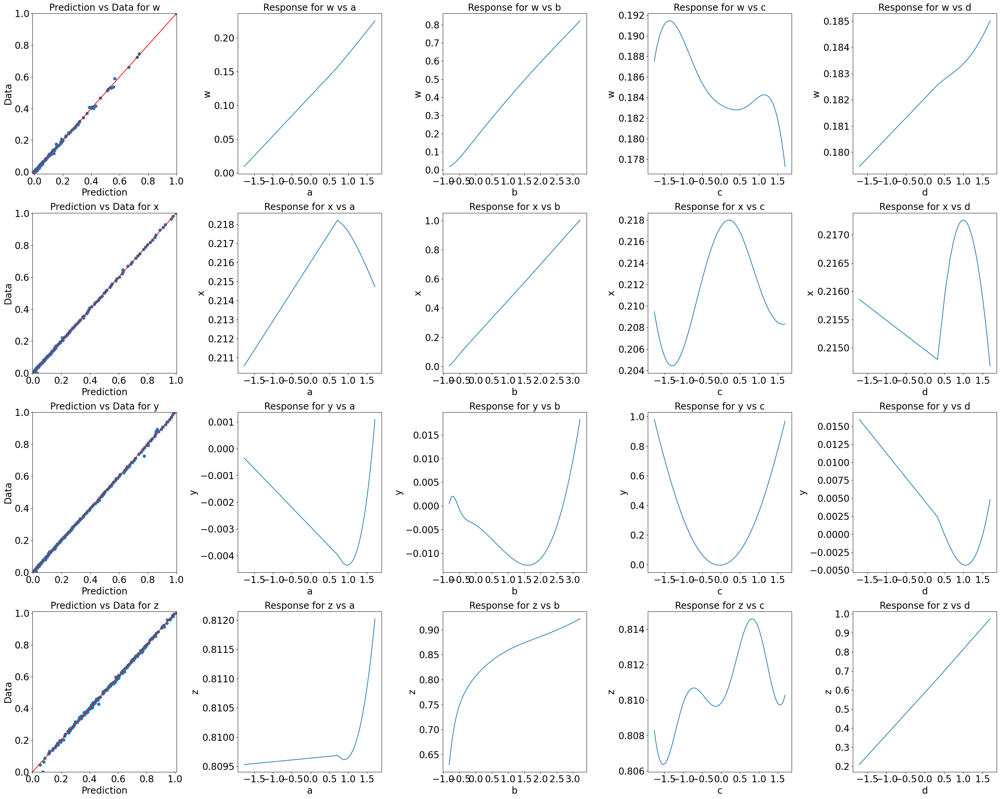

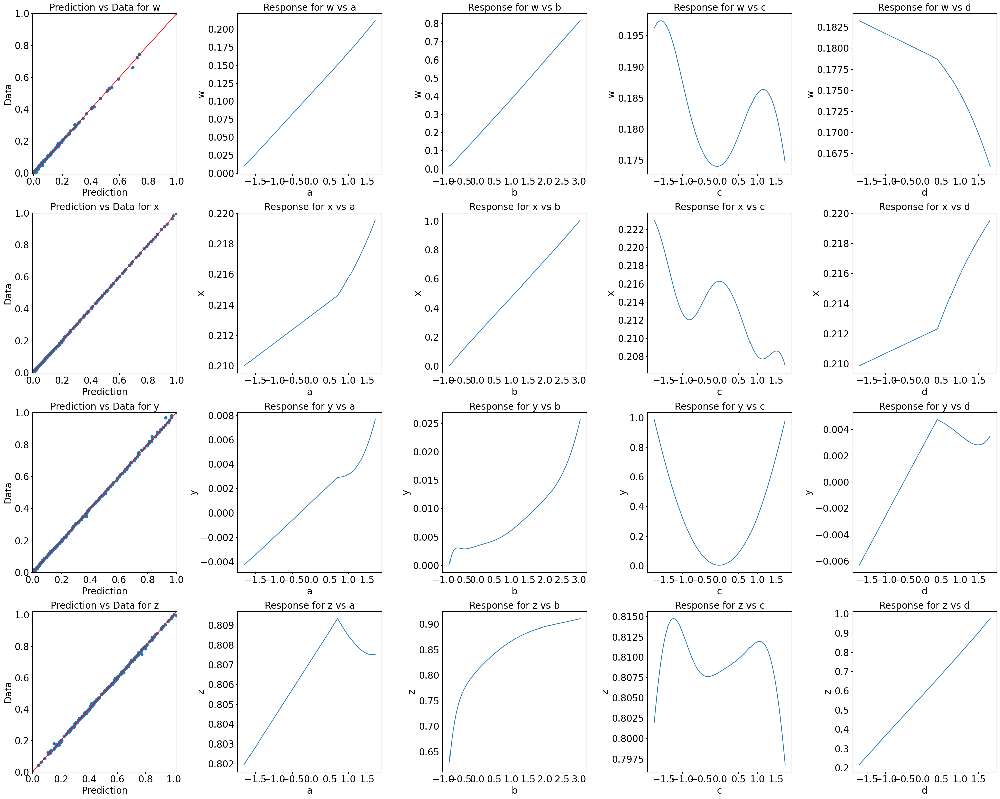

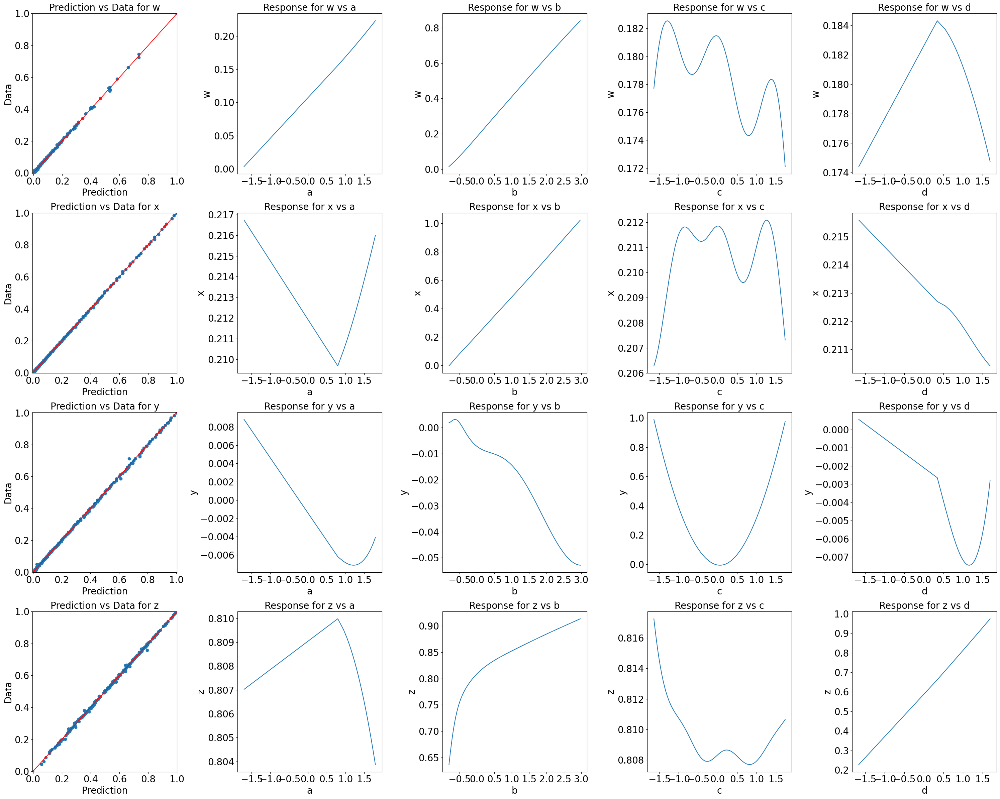

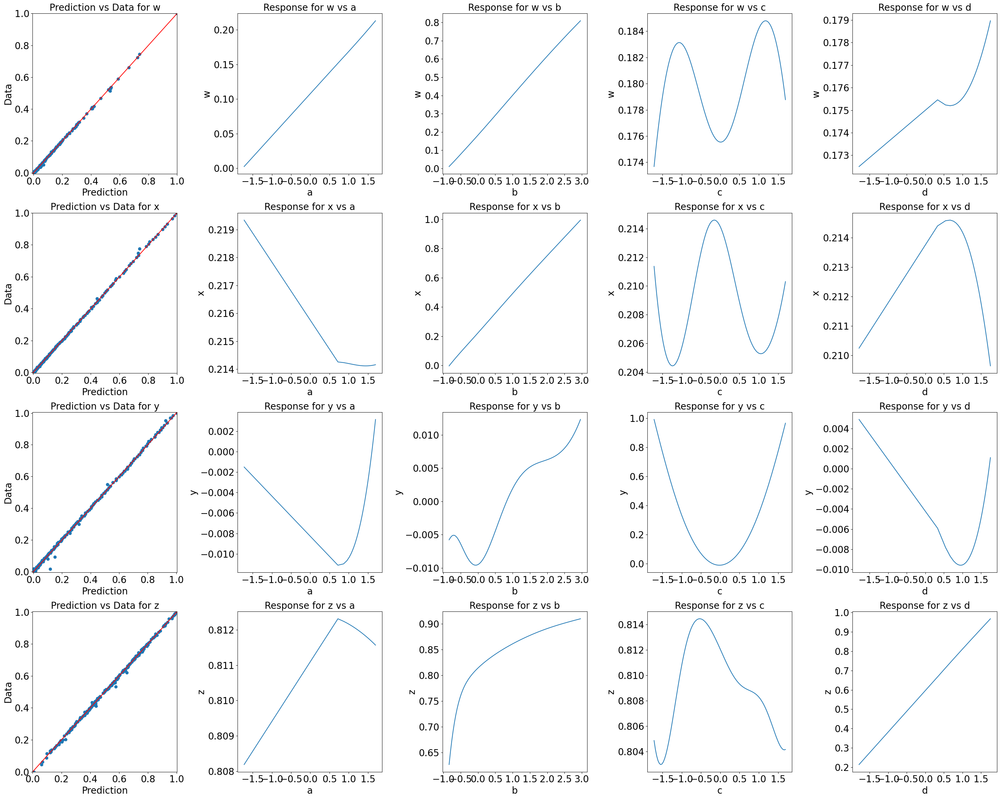

In [14]:
for idx, regressor in enumerate(ensemble.regressors):
    params = RegressorPlotParameters(regressor, app.factors.mean(), app.factors.min(), app.factors.max())
    reg_plot = RegressorPlot(params)
    reg_plot.plot_scaled()

In [15]:
#make predictions with all of the regressors on the full dataset

predictions = []
for regressor in ensemble.regressors:
    predictions.append(regressor.predict(app.factors))

In [16]:
#create a new dataframe that has the mean of all of the corresponding predictions
array_3d = np.stack([df.to_numpy() for df in predictions], axis=-1)


In [17]:
mean_df = pd.DataFrame(np.mean(array_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)
std_df = pd.DataFrame(np.std(array_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)

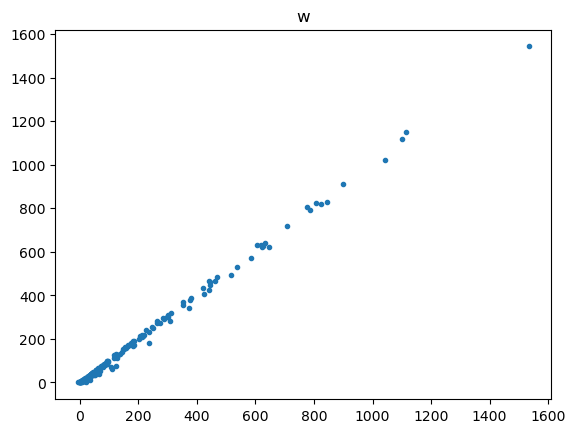

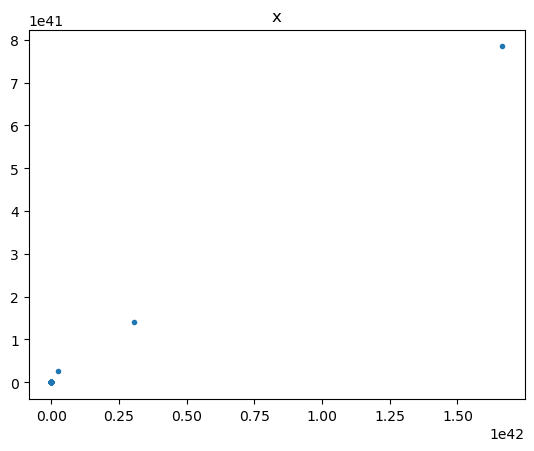

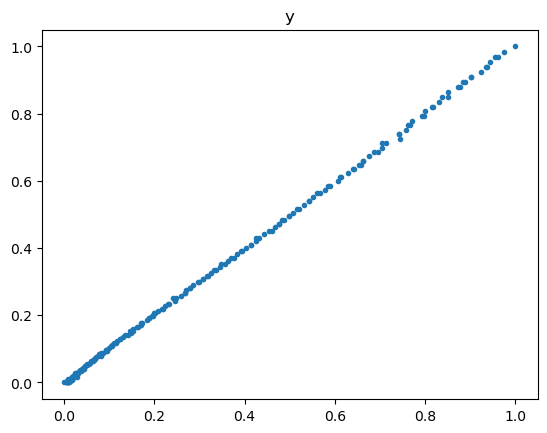

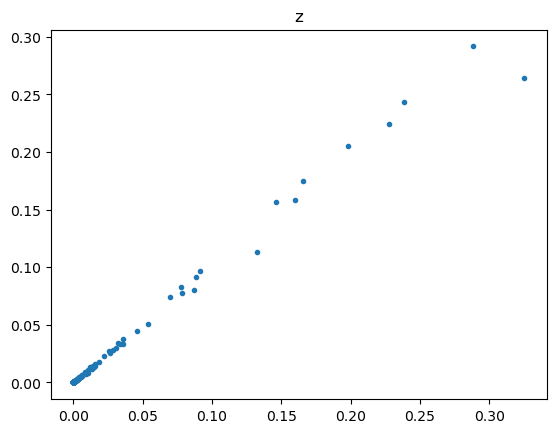

In [18]:
#for each column in mean_df create a plot vs the actual value in responses
for column in mean_df.columns:
    plt.figure()
    plt.title(column)
    plt.plot(mean_df[column], app.responses[column], '.')

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


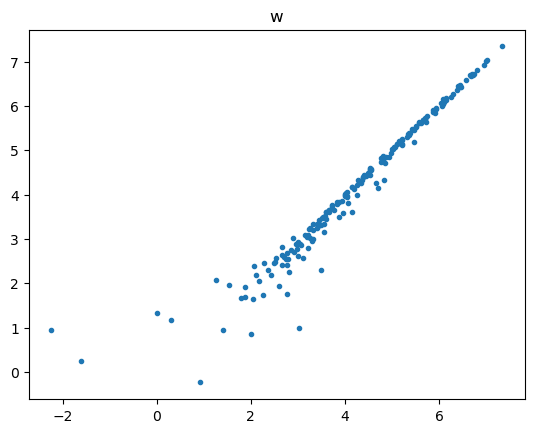

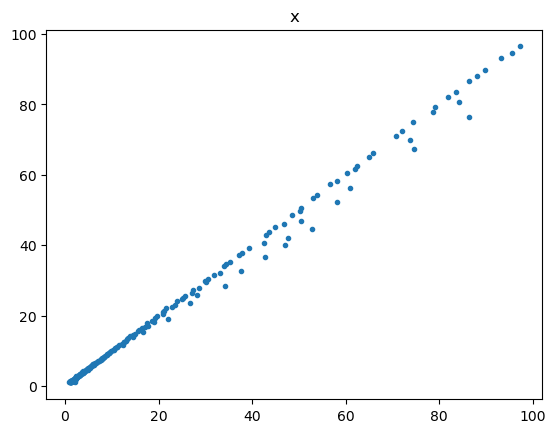

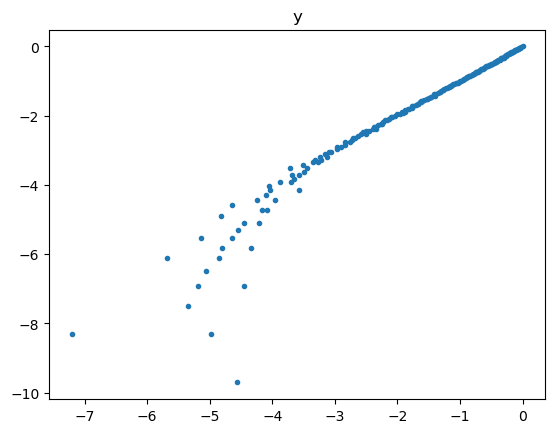

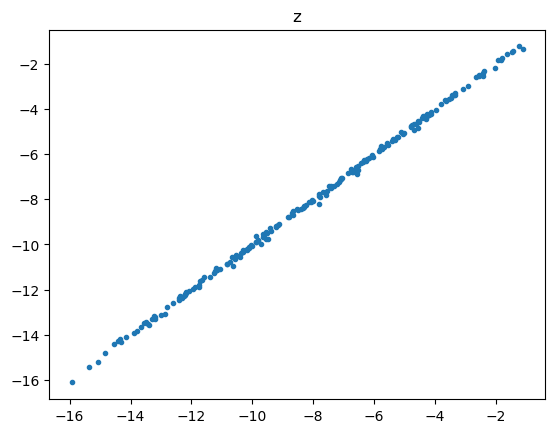

In [19]:
for column in mean_df.columns:
    plt.figure()
    plt.title(column)
    plt.plot(np.log(mean_df[column]), np.log(app.responses[column]), '.')

In [20]:
#make a regressor against the full data
mlp_reg_data_full = TorchMultiLayerPerceptronRegressionParameters(input_data=app.factors,
                                        output_data=app.responses,
                                        learning_rate="adaptive",
                                        hidden_layer_sizes=[512, 512, 64, 8, 64, 128],
                                        learning_rate_patience=25,
                                        learning_rate_factor=0.7,
                                        learning_rate_init=0.0007,
                                        early_stopping_patience=50,
                                        train_test_split="sequential",
                                        validation_fraction=0.25,
                                        max_iter=1000,
                                        batch_size=128)

mlp_regressor_full = TorchMultiLayerPerceptronRegressor(mlp_reg_data_full)
mlp_regressor_full.fit()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | loss_fn | MSELoss    | 0     
1 | model   | Sequential | 307 K 
---------------------------------------
307 K     Trainable params
0         Non-trainable params
307 K     Total params
1.232     Total estimated model params size (MB)


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('val_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 0: 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pytorch_lightning/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Epoch 999: 100%|██████████| 2/2 [00:00<00:00, 81.43it/s, val_loss=3.51e-5, train_loss=4.88e-6] 

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 999: 100%|██████████| 2/2 [00:00<00:00, 74.58it/s, val_loss=3.51e-5, train_loss=4.88e-6]


In [21]:
print(f"Error: {mlp_regressor_full.error_metrics()['nrmse']}")

Error: 0.00832196764650261


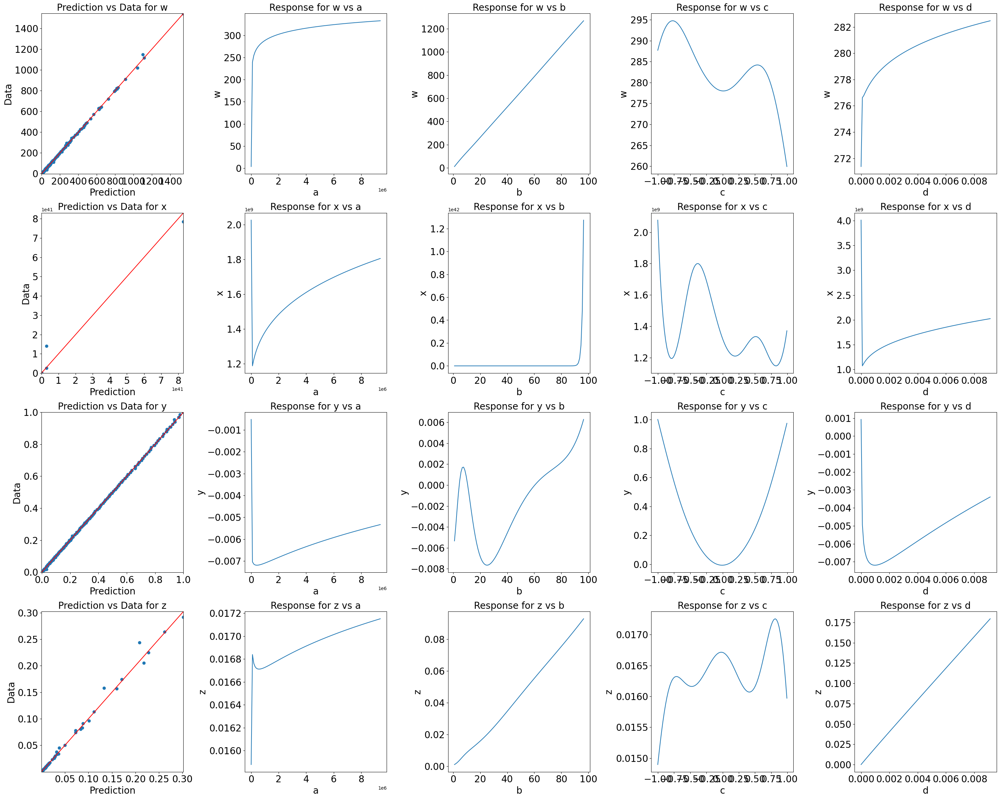

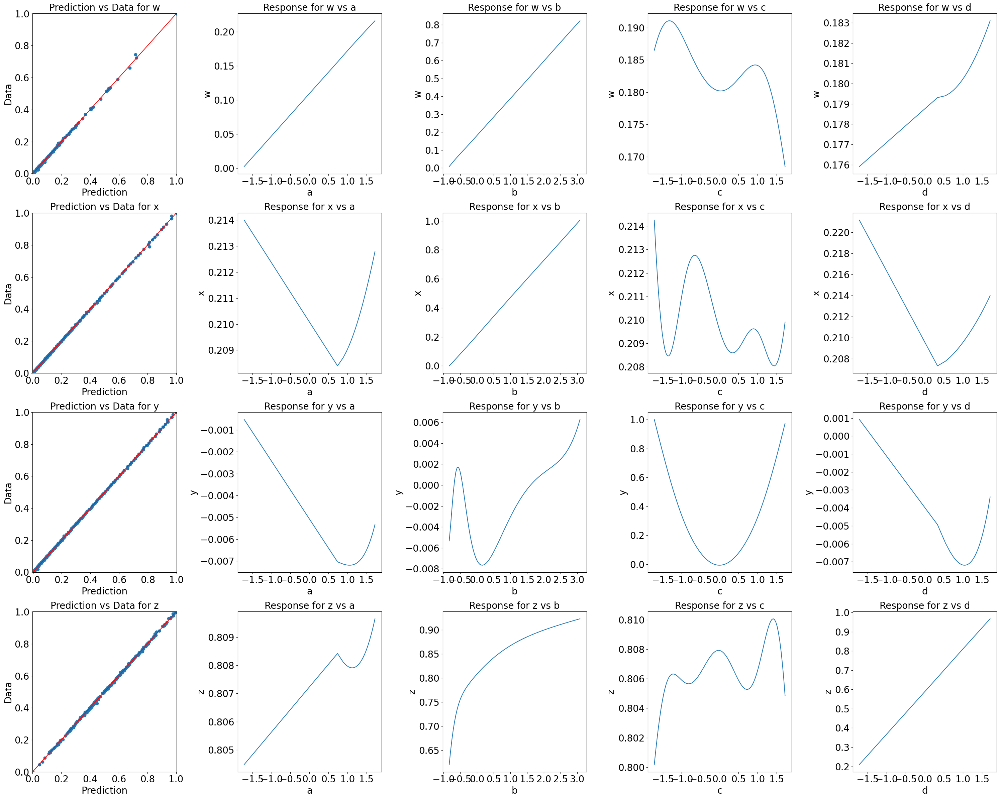

In [22]:
params_full = RegressorPlotParameters(mlp_regressor_full, app.factors.mean(), app.factors.min(), app.factors.max())
reg_plot_full = RegressorPlot(params_full)
reg_plot_full.plot()
reg_plot_full.plot_scaled()

In [23]:
predictions_full = mlp_regressor_full.predict(app.factors)

/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


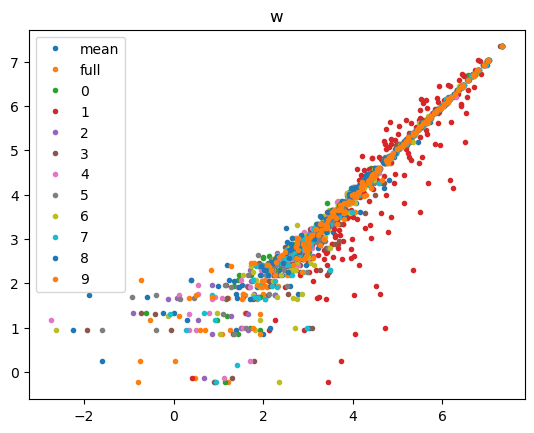

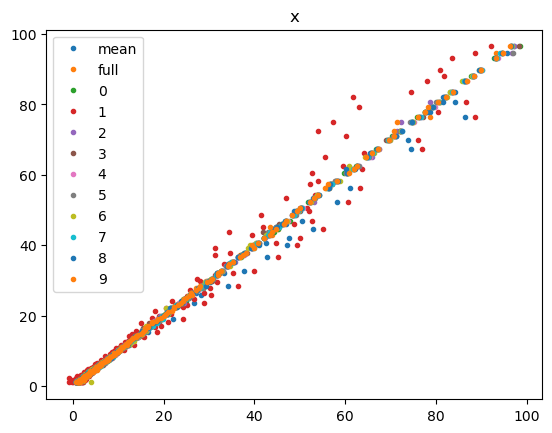

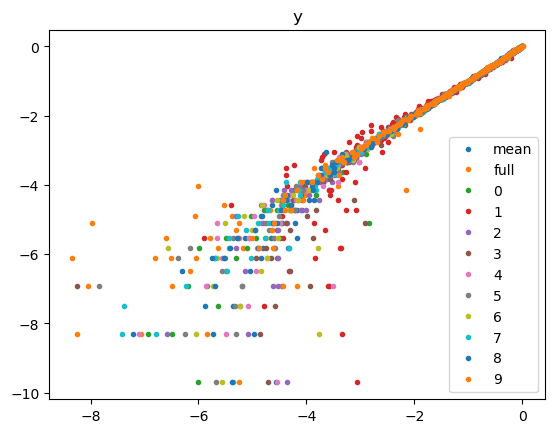

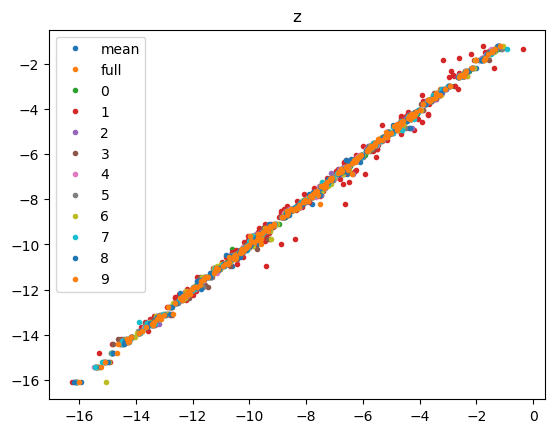

In [24]:
for column in mean_df.columns:
    plt.figure()
    plt.title(column)
    plt.plot(np.log(mean_df[column]), np.log(app.responses[column]), '.', label="mean")
    plt.plot(np.log(predictions_full[column]), np.log(app.responses[column]), '.', label="full")
    for idx,prediction in enumerate(predictions):
        plt.plot(np.log(prediction[column]), np.log(app.responses[column]), '.', label=idx)
    plt.legend()

In [25]:
#Look at the mean prediction error for each regressor vs the dataset
errors = {}
for idx, prediction in enumerate(predictions):
    error = np.sqrt((prediction/app.responses.max() - app.responses/app.responses.max())**2).mean()
    errors[idx] = error
    print(f'Regressor {idx} error: {error}')

Regressor 0 error: w    0.002959
x    0.031392
y    0.003809
z    0.002950
dtype: float64
Regressor 1 error: w    0.038148
x    0.006010
y    0.014951
z    0.023901
dtype: float64
Regressor 2 error: w    0.002381
x    0.009766
y    0.004670
z    0.002238
dtype: float64
Regressor 3 error: w    0.003841
x    0.023845
y    0.007409
z    0.003725
dtype: float64
Regressor 4 error: w    0.002369
x    0.000529
y    0.004122
z    0.002880
dtype: float64
Regressor 5 error: w    0.002745
x    0.007607
y    0.003549
z    0.003365
dtype: float64
Regressor 6 error: w    0.003622
x    0.002307
y    0.003923
z    0.003919
dtype: float64
Regressor 7 error: w    0.002336
x    0.000483
y    0.003180
z    0.003903
dtype: float64
Regressor 8 error: w    0.003220
x    0.000349
y    0.003775
z    0.001380
dtype: float64
Regressor 9 error: w    0.002603
x    0.001110
y    0.005594
z    0.002526
dtype: float64


In [26]:
error = np.sqrt((predictions_full/app.responses.max() - app.responses/app.responses.max())**2).mean()
errors['full'] = error
print(f'Regressor {idx} error: {error}')

Regressor 9 error: w    0.002080
x    0.001024
y    0.002066
z    0.002557
dtype: float64


In [27]:
error = np.sqrt((mean_df/app.responses.max() - app.responses/app.responses.max())**2).mean()
errors['mean'] = error
print(f'Regressor {idx} error: {error}')

Regressor 9 error: w    0.004509
x    0.006666
y    0.003979
z    0.003112
dtype: float64


In [28]:
pd.DataFrame(errors).T

,w,x,y,z
0,0.002959,0.031392,0.003809,0.002950
1,0.038148,0.006010,0.014951,0.023901
2,0.002381,0.009766,0.004670,0.002238
3,0.003841,0.023845,0.007409,0.003725
4,0.002369,0.000529,0.004122,0.002880
5,0.002745,0.007607,0.003549,0.003365
6,0.003622,0.002307,0.003923,0.003919
7,0.002336,0.000483,0.003180,0.003903
8,0.003220,0.000349,0.003775,0.001380
9,0.002603,0.001110,0.005594,0.002526


In [29]:
errors = {}

for idx, regressor in enumerate(ensemble.regressors):
    errors[idx] = regressor.error_metrics(multioutput="raw_values")['nrmse']

error_df = pd.DataFrame(errors).T
error_df.columns = app.responses.columns

In [30]:
error_df/error_df.sum()

,w,x,y,z
0,0.051953,0.398703,0.078781,0.043781
1,0.609438,0.064249,0.231086,0.483053
2,0.032554,0.088452,0.077754,0.027000
3,0.060091,0.302537,0.119318,0.064175
4,0.040025,0.004704,0.072738,0.047912
5,0.040147,0.092414,0.080479,0.077292
6,0.051187,0.026903,0.077291,0.067792
7,0.038316,0.005359,0.065451,0.133364
8,0.040506,0.003368,0.069458,0.016342
9,0.035782,0.013310,0.127642,0.039289


In [31]:
weights = (1.0/error_df)/(1.0/error_df).sum()
weights

,w,x,y,z
0,0.088943,0.002944,0.110489,0.103713
1,0.007582,0.018270,0.037667,0.009400
2,0.141942,0.013271,0.111948,0.168170
3,0.076897,0.003880,0.072951,0.070754
4,0.115448,0.249512,0.119667,0.094771
5,0.115098,0.012702,0.108157,0.058747
6,0.090273,0.043632,0.112618,0.066979
7,0.120598,0.219041,0.132991,0.034047
8,0.114079,0.348560,0.125319,0.277849
9,0.129139,0.088188,0.068194,0.115571


In [32]:
mean_df = pd.DataFrame(np.mean(array_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)
std_df = pd.DataFrame(np.std(array_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)

In [33]:
weights_predictions = [df * weights.iloc[idx] for idx,df in enumerate(predictions)]

In [34]:
#create a new dataframe that has the mean of all of the corresponding predictions
array_weight_3d = np.stack([df.to_numpy() for df in weights_predictions], axis=-1)

In [35]:
mean_weight_df = pd.DataFrame(np.sum(array_weight_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)

In [41]:
error = np.sqrt((predictions_full/app.responses.max() - app.responses/app.responses.max())**2).mean()
errors['full'] = error

error = np.sqrt((mean_df/app.responses.max() - app.responses/app.responses.max())**2).mean()
errors['mean'] = error

error = np.sqrt((mean_weight_df/app.responses.max() - app.responses/app.responses.max())**2).mean()
errors['weight_mean'] = error

In [42]:
pd.DataFrame(errors).T

,w,x,y,z
0,0.005508,0.440920,0.006511,0.011072
1,0.064617,0.071052,0.019097,0.122165
2,0.003452,0.097818,0.006426,0.006828
3,0.006371,0.334572,0.009861,0.016230
4,0.004244,0.005203,0.006011,0.012117
5,0.004257,0.102200,0.006651,0.019547
6,0.005427,0.029751,0.006388,0.017145
7,0.004063,0.005926,0.005409,0.033728
8,0.004295,0.003724,0.005740,0.004133
9,0.003794,0.014720,0.010549,0.009936


/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/wheymann/mambaforge/envs/gumps_gpu_311/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


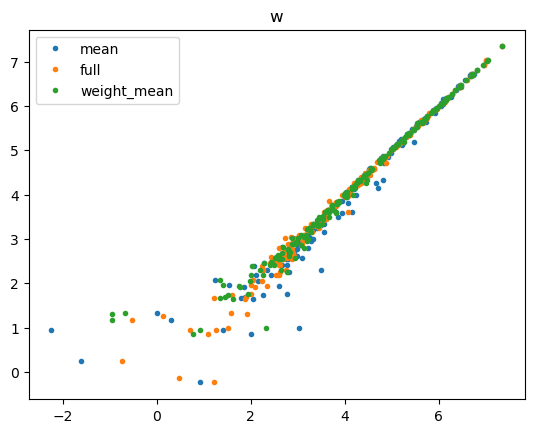

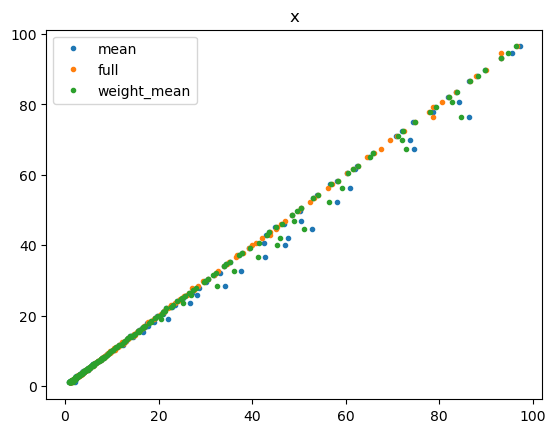

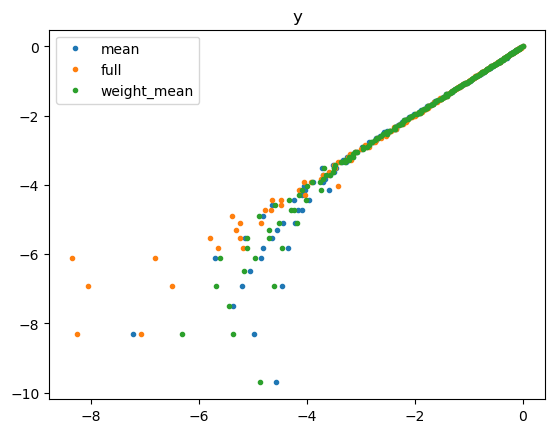

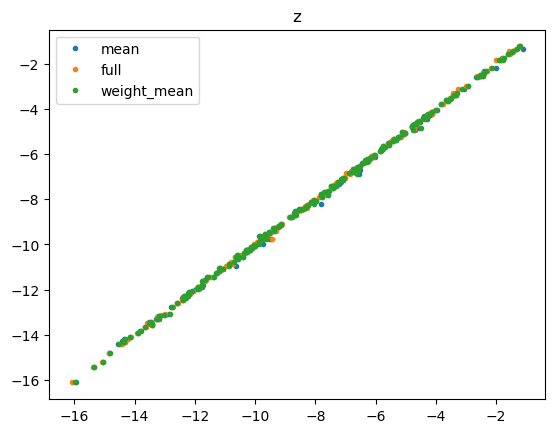

In [38]:
for column in mean_df.columns:
    plt.figure()
    plt.title(column)
    plt.plot(np.log(mean_df[column]), np.log(app.responses[column]), '.', label="mean")
    plt.plot(np.log(predictions_full[column]), np.log(app.responses[column]), '.', label="full")
    plt.plot(np.log(mean_weight_df[column]), np.log(app.responses[column]), '.', label="weight_mean")
    #for idx,prediction in enumerate(predictions):
    #    plt.plot(np.log(prediction[column]), np.log(app.responses[column]), '.', label=idx)
    plt.legend()